This notebook was developed during a week I spent at the Met Office in October 2023. The aim is to set up a module which can be applied to an LES simulation which calculates the entrainment. 

This notebook focusses on a single cloud from the RICO LES simulation. The next step is to generalise it so that certain statistics of interest can be applied to the entire cloud field. 

Due to the variables available in the dataset, entrainment, moist static energy and buoyancy are estimated from potential temperature and liquid water species fractions. 

In [1]:
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
import plotly.graph_objs as go
import netCDF4 as nc
import warnings
warnings.filterwarnings('ignore')
import random

def hide_toggle(for_next=False):
    this_cell = """$('div.cell.code_cell.rendered.selected')"""
    next_cell = this_cell + '.next()'

    toggle_text = 'Toggle show/hide'  # text shown on toggle link
    target_cell = this_cell  # target cell to control with toggle
    js_hide_current = ''  # bit of JS to permanently hide code in current cell (only when toggling next cell)

    if for_next:
        target_cell = next_cell
        toggle_text += ' next cell'
        js_hide_current = this_cell + '.find("div.input").hide();'

    js_f_name = 'code_toggle_{}'.format(str(random.randint(1,2**64)))

    html = """
        <script>
            function {f_name}() {{
                {cell_selector}.find('div.input').toggle();
            }}

            {js_hide_current}
        </script>

        <a href="javascript:{f_name}()">{toggle_text}</a>
    """.format(
        f_name=js_f_name,
        cell_selector=target_cell,
        js_hide_current=js_hide_current, 
        toggle_text=toggle_text
    )

    return HTML(html)

hide_toggle()

# Data overview

In [2]:
with nc.Dataset('single_3d_cloud_0.nc', 'r') as ds:
    for var_name, var in ds.variables.items():
        print(f"{var_name}: {var.shape}")
        
hide_toggle()

l: (67, 12, 16)
q: (67, 12, 16)
w: (67, 12, 16)
t: (67, 12, 16)
z: (67,)
y: (12,)
x: (16,)
s: (67, 12, 16)


Dataset variables 

- l: liquid water
- q: total water mixing ratio
- w: vertical velocity 
- t: potential temperature
- s: moist static energy

# Addition of moist static energy
The full equation for moist static energy: $h = c_{pd}T + q_vL_v + gz$

where $c_{pd}$ is the heat capacity of the dry air at constant pressure, $T$ the temperature, $q_v$ the specific vapour value, $L_v$ latent heat of vapourization of liquid water, $g$ acceleration of the gravity, $z$ the altitude. 

Temperature in terms of potential temperature is  $T = \theta (\frac{p}{p_0})^{\frac{R_d}{c_p}}$

which gives the moist static energy $s = c_{pd} (\frac{p}{p_0})^{\frac{R_d}{c_v}} + gz + L_v q_v$

However, approximation used here is:

$s = \theta + \frac{L_v}{c_p} q_v$


The cell below adds moist static energy to the field. It only has to be run once as it directly appends the new variable to the netcdf files. It can only be run if the files aren't being used elsewhere at that time. 

In [3]:
L_v = 2260000  # Latent heat of vaporization
c_pd = 1004.5  # Specific heat of dry air at constant pressure

for i in range(21):  # Loop from 0 to 20 inclusive
    filename = f'single_3d_cloud_{i}.nc'
    
    with nc.Dataset(filename, 'a') as ds:
        theta = ds.variables['t'][:]
        q_v = ds.variables['q'][:] - ds.variables['l'][:]
        
        s = theta + (L_v/c_pd) * q_v

        # Check if the variable 's' already exists, if so, overwrite it, if not, create it
        if 's' in ds.variables:
            ds.variables['s'][:] = s
        else:
            # Create a new variable 's' with the same dimensions as 't'
            s_var = ds.createVariable('s', theta.dtype, ('z', 'y', 'x'))
            s_var[:] = s
            s_var.units = 'K'
hide_toggle()

# Addition of buoyancy

Buoyancy approximated as

$ \theta_v= \theta ( 1 + 0.6 q_v – q_h) $

Unfinished

In [4]:
# choose specific time slice: ranges from 0 to 21
data = xr.open_dataset("single_3d_cloud_15.nc")

# choose the variable displayed
variable = 'l'

# Heatmap of *variable* for all heights

In [5]:
# x_coords = data['x']
# y_coords = data['y']
# z_coords = data['z']

# z_values = np.linspace(z_coords.min(), z_coords.max(), num=50)

# global_vmin = data[variable].min()
# global_vmax = data[variable].max()

# # Create a figure and axis for the initial heatmap
# fig, ax = plt.subplots(figsize=(10, 6))
# data_at_z = data[variable].isel(z=0)
# heatmap = ax.imshow(data_at_z, cmap='viridis', origin='lower',
#                     extent=[x_coords.min(), x_coords.max(), y_coords.min(), y_coords.max()],
#                     vmin=global_vmin, vmax=global_vmax)  # Set global vmin and vmax
# ax.set_xlabel('X')
# ax.set_ylabel('Y')
# ax.set_title(f'Heatmap of Variable at z={z_coords[0].values:.2f} meters')  # Corrected line
# plt.colorbar(heatmap, label='Variable')

# def update_heatmap(frame):
#     z_value = z_values[frame]
#     z_index = np.abs(z_coords - z_value).argmin()
#     data_at_z = data[variable].isel(z=z_index)
#     heatmap.set_data(data_at_z)
#     ax.set_title(f'Heatmap of variable at z={z_value:.1f} meters')

# # Create the animation
# animation = FuncAnimation(fig, update_heatmap, frames=len(z_values), repeat=False)
# plt.close()
# HTML(animation.to_jshtml())

hide_toggle()

# 3d cloud visualisation

In [6]:
data = xr.open_dataset("single_3d_cloud_14.nc")
volume = data[variable].values
x_coords = data['x'].values
y_coords = data['y'].values
z_coords = data['z'].values

volume_flat = volume.flatten()
x_coords_flat = np.tile(x_coords, len(y_coords) * len(z_coords))
y_coords_flat = np.tile(np.repeat(y_coords, len(x_coords)), len(z_coords))
z_coords_flat = np.repeat(z_coords, len(x_coords) * len(y_coords))

# Color scale
color_scale = np.interp(volume_flat, (volume_flat.min(), volume_flat.max()), (0, 1))

# Array of rgba values from viridis
colors_rgba = plt.cm.viridis(color_scale)

# alpha
colors_rgba[:, 3] = (volume_flat > 0) * 0.8

fig = go.Figure(data=go.Scatter3d(
    x=x_coords_flat,
    y=y_coords_flat,
    z=z_coords_flat,
    mode='markers',
    marker=dict(
        size=5,
        color=colors_rgba,  # set color to an array/list of desired values
        showscale=False,
    )
))

fig.update_layout(scene=dict(
    xaxis=dict(title='X', range=[x_coords.min(), x_coords.max()]),
    yaxis=dict(title='Y', range=[y_coords.min(), y_coords.max()]),
    zaxis=dict(title='Z', range=[z_coords.min(), z_coords.max()]),
))

fig.show()

hide_toggle()

# Volume & surface calculations

## Ideas
- stack overflow answer to a similar question: https://stackoverflow.com/questions/43153067/find-volume-defined-by-irregular-data-points-python
- Porespy: https://porespy.org/examples/metrics/reference/mesh_surface_area.html
- convex hull 
- general quora answer: https://www.quora.com/What-is-the-Python-code-calculating-area-surface-area-of-2D-3D-shapes

## Closed ideas
- bpy: only works for a specific version of python. 


## Method: check exposed faces and calculate area
If the current grid cell (l[i, j, k]) has a value greater than zero (containing cloud), the code checks each face of the cell to see if it's exposed to the exterior or adjacent to an air cell (where l=0). For each exposed face, its area is added to the total cloud surface area. The code uses conditions to determine which faces are exposed and computes their areas using the dimensions dx, dy, and dz.
~~~
for i in range(l.shape[0]):
    for j in range(l.shape[1]):
        for k in range(l.shape[2]):
            if l[i, j, k] > 0:
~~~

# Sanity check
## Plotting the actual boundaries for every time slice to see if is finding it correctly

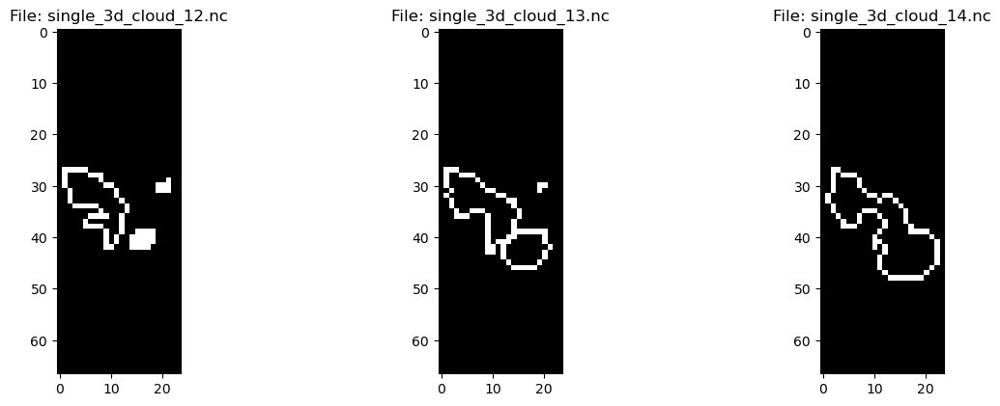

In [7]:
def compute_boundary_slice(file_name):
    dataset = nc.Dataset(file_name)
    l = dataset.variables['l'][:]
    boundaries = np.zeros_like(l)
    
    for i in range(l.shape[0]):
        for j in range(l.shape[1]):
            for k in range(l.shape[2]):
                if l[i, j, k] > 0:
                    if i == 0 or l[i-1, j, k] == 0: boundaries[i, j, k] = 1
                    if i == l.shape[0]-1 or l[i+1, j, k] == 0: boundaries[i, j, k] = 1
                    if j == 0 or l[i, j-1, k] == 0: boundaries[i, j, k] = 1
                    if j == l.shape[1]-1 or l[i, j+1, k] == 0: boundaries[i, j, k] = 1
                    if k == 0 or l[i, j, k-1] == 0: boundaries[i, j, k] = 1
                    if k == l.shape[2]-1 or l[i, j, k+1] == 0: boundaries[i, j, k] = 1
    return boundaries[:, :, l.shape[2]//2]

start = 12
plt.figure(figsize=(12, 12))
for idx in range(3):
    file_name = f"single_3d_cloud_{start+idx}.nc"
    boundary_slice = compute_boundary_slice(file_name)    
    plt.subplot(3, 3, idx+1)
    plt.imshow(boundary_slice, cmap='gray')
    plt.title(f"File: single_3d_cloud_{start+idx}.nc")
plt.tight_layout()
plt.show()

hide_toggle()

For each timestep, cloud volume (top left plot) and surface (top right plot) are calculated. Then, the cloud surface to volume ratio s-v is:

cloud s-v ratio is $\frac{S_c}{V_c}$, 

which is shown in the bottom left plot. From the cloud volume, equivalent radius for a sphere of that volume is calculated. Equivalent sphere s-v ratio is $\frac{S_{se}}{V_{se}}$, where the $s$ in subscript stands for "sphere equivalent" and it is calculate by taking $V_c$ and calculating the radius that a sphere of equivalent volume would have, $R_{se}$. Then the sprawling factor is 

$SF = \frac{\frac{S_c}{V_c}}{\frac{S_{se}}{V_{se}}}$

which is shown in the bottom right plot.


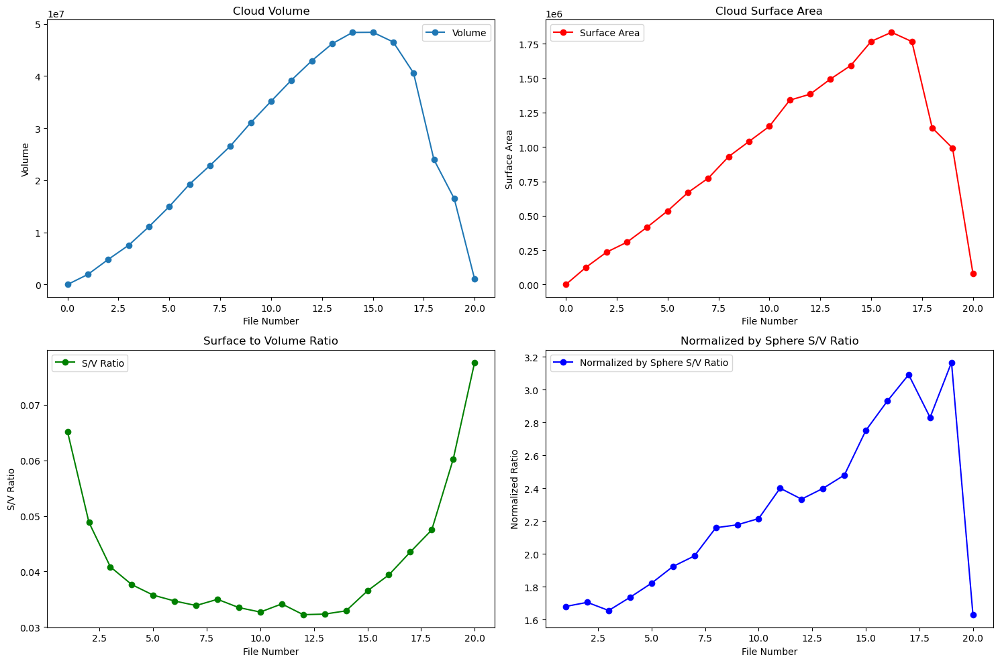

In [8]:
def calculate_cloud_properties(file_name):
    dataset = nc.Dataset(file_name)

    l = dataset.variables['l'][:]
    x = dataset.variables['x'][:]
    y = dataset.variables['y'][:]
    z = dataset.variables['z'][:]

    # Calculate the differential dimensions
    dx = x[1] - x[0]
    dy = y[1] - y[0]
    dz = z[1] - z[0]

    # Volume of a single cell
    V_cell = dx * dy * dz

    # Total volume of cloud
    cloud_cells = np.sum(l > 0)
    V_total = cloud_cells * V_cell

    # For surface area, loop through cloud cells, 
    # check exposed faces and accumulate surface area
    A_total = 0
    for i in range(l.shape[0]):
        for j in range(l.shape[1]):
            for k in range(l.shape[2]):
                if l[i, j, k] > 0:
                    # Check each face
                    if i == 0 or l[i-1, j, k] == 0: 
                        A_total += dy * dz
                    if i == l.shape[0]-1 or l[i+1, j, k] == 0: 
                        A_total += dy * dz
                    if j == 0 or l[i, j-1, k] == 0:
                        A_total += dx * dz
                    if j == l.shape[1]-1 or l[i, j+1, k] == 0:
                        A_total += dx * dz
                    if k == 0 or l[i, j, k-1] == 0:
                        A_total += dx * dy
                    if k == l.shape[2]-1 or l[i, j, k+1] == 0:
                        A_total += dx * dy
    return V_total, A_total

# Loop through all files
volumes = []
areas = []
for i in range(21):  # 0 to 20 inclusive
    file_name = f"single_3d_cloud_{i}.nc"
    V, A = calculate_cloud_properties(file_name)
    volumes.append(V)
    areas.append(A)

# Compute ratios
ratios = np.array(areas) / np.array(volumes)

# Compute equivalent radii and normalize by corresponding r_sphere
equivalent_radii = (3 * np.array(volumes) / (4 * np.pi))**(1/3)

r_spheres = 3 / equivalent_radii
normalized_ratios_by_sphere = ratios / r_spheres

# Plotting
x = range(21)
plt.figure(figsize=(15, 10))

# Volume plot
plt.subplot(2, 2, 1)
plt.plot(x, volumes, marker='o', label='Volume')
plt.xlabel('File Number')
plt.ylabel('Volume')
plt.title('Cloud Volume')
plt.legend()

# Surface Area plot
plt.subplot(2, 2, 2)
plt.plot(x, areas, marker='o', color='r', label='Surface Area')
plt.xlabel('File Number')
plt.ylabel('Surface Area')
plt.title('Cloud Surface Area')
plt.legend()

# Surface to Volume Ratio plot
plt.subplot(2, 2, 3)
plt.plot(x, ratios, marker='o', color='g', label='S/V Ratio')
plt.xlabel('File Number')
plt.ylabel('S/V Ratio')
plt.title('Surface to Volume Ratio')
plt.legend()

# Normalized Ratio by equivalent sphere plot
plt.subplot(2, 2, 4)
plt.plot(x, normalized_ratios_by_sphere, marker='o', color='b', label='Normalized by Sphere S/V Ratio')
plt.xlabel('File Number')
plt.ylabel('Normalized Ratio')
plt.title('Normalized by Sphere S/V Ratio')
plt.legend()

plt.tight_layout()
plt.show()

hide_toggle()

# Statistics For Moist Static Energy

# Cloud center height only

Taking the vertical mid-point of the cloud. At that height level, the average mse of the inside of the cloud and the environment are calculated. 

# Full time-series

For every time step of the cloud life cycle.

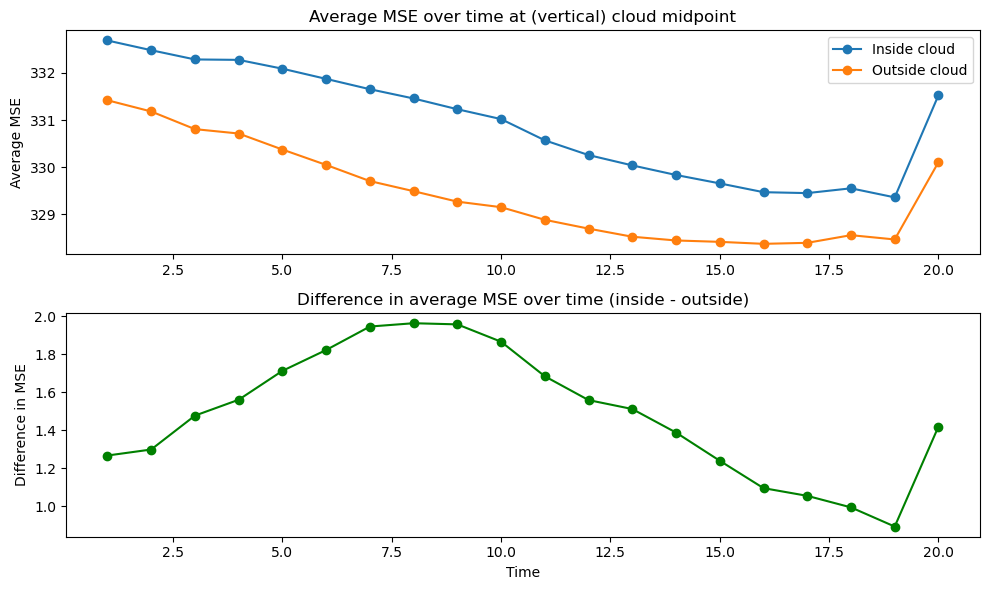

In [9]:
s_inside_all = []
s_outside_all = []

for file_num in range(21):
    filename = f'single_3d_cloud_{file_num}.nc'
    dataset = nc.Dataset(filename)
    
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    
    # Cloud height range
    cloud_z_indices = np.where(np.any(l > 0, axis=(1, 2)))[0]
    
    # If there's no cloud in the dataset for any height, skip (first, and last?)
    if cloud_z_indices.size == 0:
        s_inside_all.append(np.nan)
        s_outside_all.append(np.nan)
        dataset.close()
        continue
    
    min_cloud_z = cloud_z_indices.min()
    max_cloud_z = cloud_z_indices.max()
    
    # Find midpoint level
    midpoint_level = (min_cloud_z + max_cloud_z) // 2
    
    # Masked arrays to separate inside and outside cloud points at the midpoint level
    s_inside = np.ma.masked_where(l[midpoint_level, :, :] <= 0, s[midpoint_level, :, :])
    s_outside = np.ma.masked_where(l[midpoint_level, :, :] > 0, s[midpoint_level, :, :])
    
    # Calculate averages and append to lists
    s_inside_avg = s_inside.compressed().mean()
    s_outside_avg = s_outside.compressed().mean()
    
    s_inside_all.append(s_inside_avg)
    s_outside_all.append(s_outside_avg)
    dataset.close()
    
    
time = list(range(21))

# Difference between the two averages for each time step
difference = np.array(s_inside_all) - np.array(s_outside_all)

fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,6))
ax1.plot(time, s_inside_all, label="Inside cloud", marker="o")
ax1.plot(time, s_outside_all, label="Outside cloud", marker="o")
ax1.set_ylabel("Average MSE")
ax1.set_title("Average MSE over time at (vertical) cloud midpoint")
ax1.legend()
ax2.plot(time, difference, color="green", marker = "o")
ax2.set_xlabel("Time")
ax2.set_ylabel("Difference in MSE")
ax2.set_title("Difference in average MSE over time (inside - outside)")
plt.tight_layout()
plt.show()

hide_toggle()

# Entire cloud height (mean)

For every level which has cloud water in the file, calculate the ratio of the averages of MSE inside and outside the cloud. 

# Single time only

Look at a single time slice, not the entire life cycle.

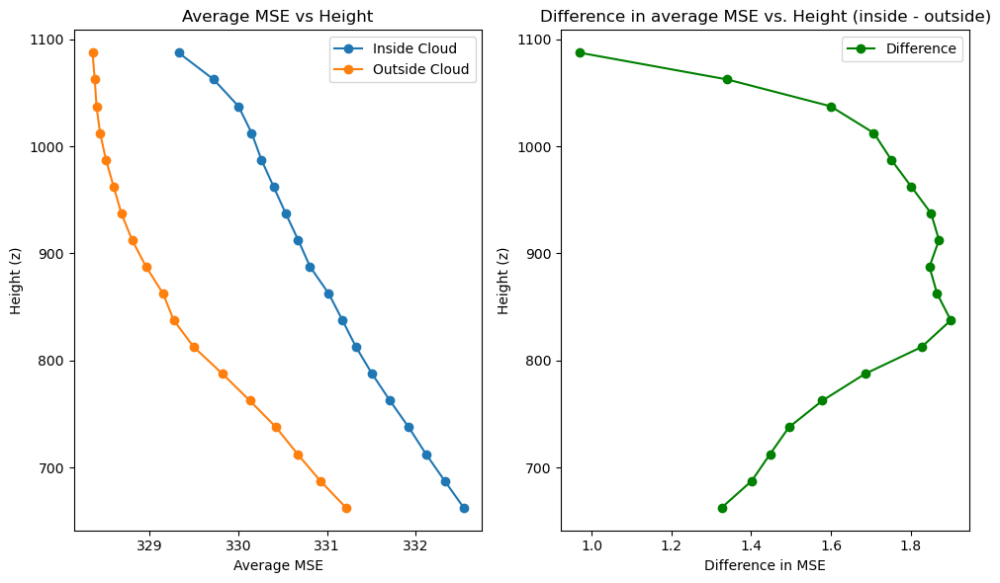

In [10]:
dataset = nc.Dataset('single_3d_cloud_10.nc')

l = dataset.variables['l'][:]
z = dataset.variables['z'][:]
s = dataset.variables['s'][:]

s_inside_levels = []
s_outside_levels = []

# Determine which z levels have cloud water
cloud_z_indices = np.where(np.any(l > 0, axis=(1, 2)))[0]

# For each cloud-containing level, compute the average s inside and outside the cloud
for z_idx in cloud_z_indices:
    cloud_mask = l[z_idx, :, :] > 0
    s_inside = np.mean(s[z_idx, cloud_mask])
    s_outside = np.mean(s[z_idx, ~cloud_mask])
    
    s_inside_levels.append(s_inside)
    s_outside_levels.append(s_outside)

# Calculate the differences
differences = np.array(s_inside_levels) - np.array(s_outside_levels)

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10,6))
ax1.plot(s_inside_levels, z[cloud_z_indices], label="Inside Cloud", marker="o")
ax1.plot(s_outside_levels, z[cloud_z_indices], label="Outside Cloud", marker="o")
ax1.set_xlabel("Average MSE")
ax1.set_ylabel("Height (z)")
ax1.set_title("Average MSE vs Height")
ax1.legend()
ax2.plot(differences, z[cloud_z_indices], label="Difference", color="green", marker="o")
ax2.set_xlabel("Difference in MSE")
ax2.set_ylabel("Height (z)")
ax2.set_title("Difference in average MSE vs. Height (inside - outside)")
ax2.legend()
plt.tight_layout()
plt.show()

hide_toggle()

# Entire cloud height (mean)


# Entire time-series

Taking the right plot from above (difference between MSE inside and outside) but creating an animation showing all time steps. 

In [11]:
all_mse_differences = []

for file_num in range(21):
    file_path = f'single_3d_cloud_{file_num}.nc'
    dataset = nc.Dataset(file_path)
    
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    
    mse_inside = []
    mse_outside = []

    for idx in range(l.shape[0]):
        # Check if there's cloud water in this level
        if np.sum(l[idx, :, :]) > 0:
            inside_mask = l[idx, :, :] > 0
            mse_inside_val = np.mean(s[idx, :, :][inside_mask])
            mse_outside_val = np.mean(s[idx, :, :][~inside_mask])
            
            mse_inside.append(mse_inside_val)
            mse_outside.append(mse_outside_val)
        else:
            mse_inside.append(np.nan)
            mse_outside.append(np.nan)

    mse_diff = np.array(mse_inside) - np.array(mse_outside)
    all_mse_differences.append(mse_diff)

all_mse_differences = np.array(all_mse_differences)


# Plotting
fig, ax = plt.subplots(figsize=(10, 6))
line, = ax.plot([], [], lw=2, marker = "o")
plt.xlabel('MSE Difference')
plt.ylabel('Height (z)')
plt.title('MSE Difference over height for all files')

# Initialization function: plot background
def init():
    line.set_data([], [])
    return line,

# Animation function. Called sequentially
def update(file_num):
    line.set_data(all_mse_differences[file_num], z)
    ax.set_xlim(np.nanmin(all_mse_differences), np.nanmax(all_mse_differences))
    ax.set_ylim(z[0], z[-1])
    return line,

# Create the animation object
ani = FuncAnimation(fig, update, frames=range(21), init_func=init, blit=True)
plt.close(fig)
HTML(ani.to_jshtml())

# Total cloud MSE

Suggestion to look at total (summed) cloud MSE. 

The red line shows the MSE growth and a sharp decline. Growth expected as the thermal insitgating the cloud is not fully above the LCL yet and is breaking through in the first part of the life cycle. 

The blue line shows the MSE per unit volume of the cloud. 

# Time-series

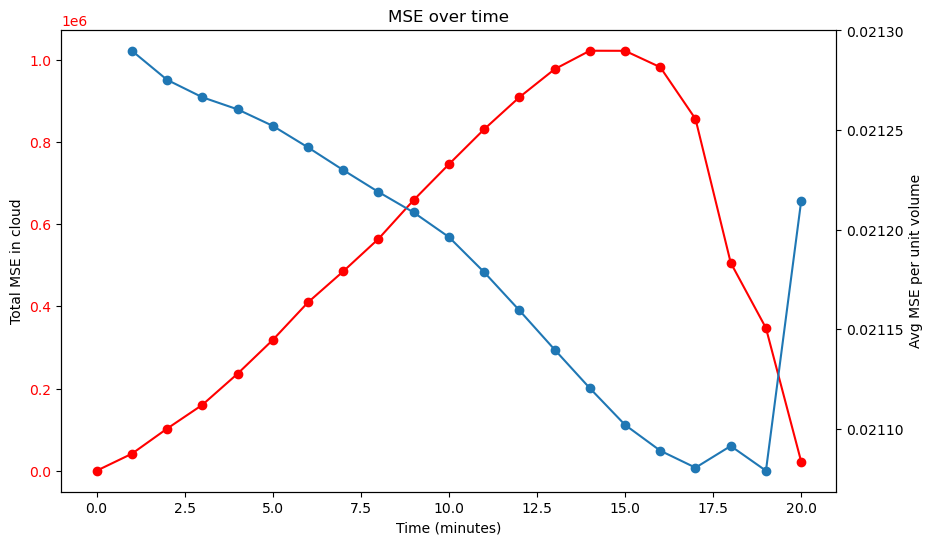

In [12]:
mse_totals = []
avg_mse_per_volume = []

for file_num in range(21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    x = dataset.variables['x'][:]
    y = dataset.variables['y'][:]
    z = dataset.variables['z'][:]
    
    dx = x[1] - x[0]
    dy = y[1] - y[0]
    dz = z[1] - z[0]
    
    V_cell = dx * dy * dz
    cloud_volume = np.sum(l > 0) * V_cell

    mse_total_for_file = np.sum(s[l > 0])
    avg_mse_for_file = mse_total_for_file / cloud_volume
    
    mse_totals.append(mse_total_for_file)
    avg_mse_per_volume.append(avg_mse_for_file)

# Plot
fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.set_xlabel('Time (minutes)')
ax1.set_ylabel('Total MSE in cloud')
ax1.plot(range(21), mse_totals, marker='o', color = 'r')
ax1.tick_params(axis='y', labelcolor = 'r')
ax2 = ax1.twinx()  # second axes that shares the same x-axis
ax2.set_ylabel('Avg MSE per unit volume')  # we already handled the x-label with ax1
ax2.plot(range(21), avg_mse_per_volume, marker='o')
ax2.tick_params(axis='y')
plt.title('MSE over time')
plt.show()

hide_toggle()

# Total MSE for all cloud points at a given height

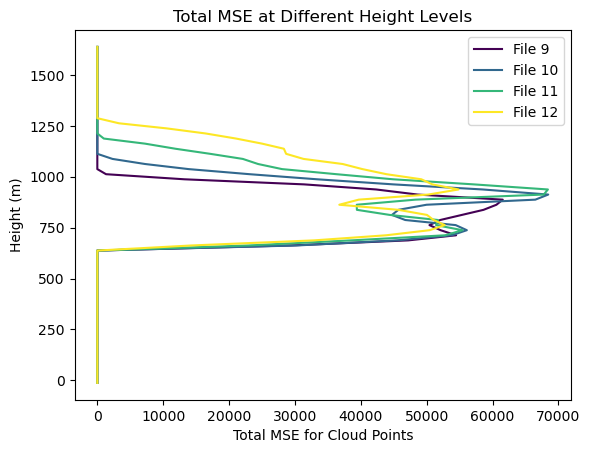

In [13]:
colors = plt.cm.viridis(np.linspace(0, 1, 4))

for file_num, color in zip(range(9, 13), colors):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]

    mse_per_height = []
    for i in range(l.shape[0]):  # Loop through the vertical dimension
        mask = l[i, :, :] > 0.0
        if np.any(mask):  # Check if there's any liquid water for this level
            mse_per_height.append(np.nansum(s[i, mask]))
        else:
            mse_per_height.append(0)

    plt.plot(mse_per_height, z, color=color, label=f'File {file_num}')

plt.xlabel("Total MSE for Cloud Points")
plt.ylabel("Height (m)")
plt.title("Total MSE at Different Height Levels")
plt.legend()
plt.show()

hide_toggle()

# Total MSE of all cloud points at a given height 

# Time-series

Mike thought it would be interested to see how it develops. It felt like the most appropriate visualisation would be this Hovmuller-like plot with time developing on the x axis, height on the y axis and the variable of interest as a heatmap

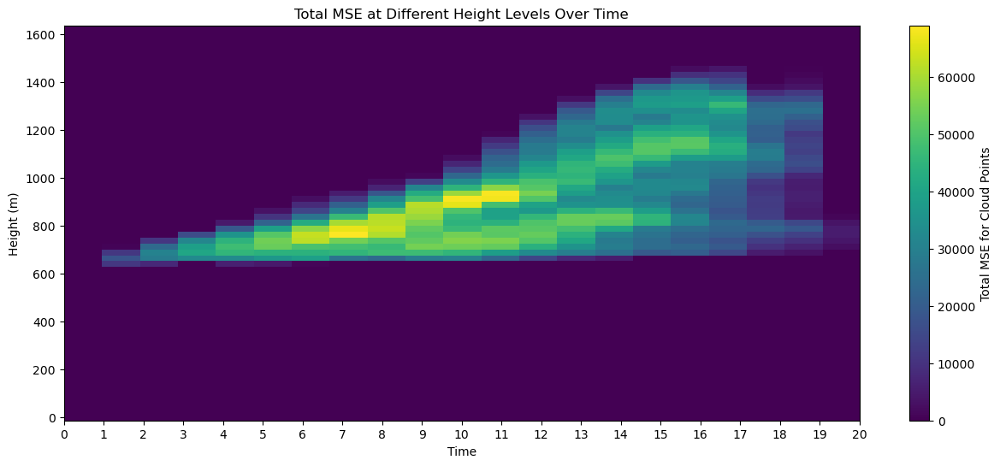

In [14]:
all_mse = []
for file_num in range(21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]

    # Calculate total MSE for points with liquid water at each height level
    mse_per_height = []
    for i in range(l.shape[0]):  # Loop through the vertical dimension
        mask = l[i, :, :] > 0.0
        if np.any(mask):  # Check if there's any liquid water for this level
            mse_per_height.append(np.nansum(s[i, mask]))
        else:
            mse_per_height.append(0)

    # Extend the MSE list with zeros if z has more levels than MSE values
    if len(z) > len(mse_per_height):
        mse_per_height.extend([0] * (len(z) - len(mse_per_height)))

    all_mse.append(mse_per_height)

# Convert the list of lists into a numpy array for plotting
all_mse_array = np.array(all_mse).T  # Transpose to have height on y-axis and time on x-axis

# Set the figure size
plt.figure(figsize=(15, 6))

# Plot the heatmap
plt.imshow(all_mse_array, aspect='auto', cmap='viridis', origin='lower', extent=[0, 20, z[0], z[-1]])
plt.colorbar(label="Total MSE for Cloud Points")
plt.xlabel("Time")
plt.ylabel("Height (m)")
plt.title("Total MSE at Different Height Levels Over Time")
plt.xticks(np.arange(21))
plt.show()

hide_toggle()


### Vertical velocity ($w$) weighted MSE
On Mike's suggestion this is $w$-weighted moist static energy, plotted in the same shape as above.

calculated as: $\frac{s_i w_i}{\bar{w}}$, where $\bar{w}$ is the height level mean. 

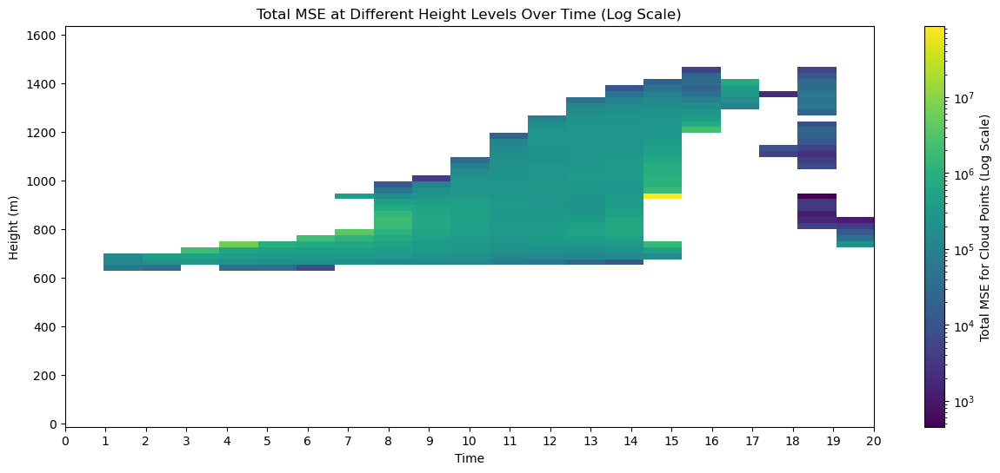

In [15]:
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc

all_mse = []

for file_num in range(21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    w = dataset.variables['w'][:]  # Assuming w is a variable in the dataset

    # Calculate the modified s values based on w and its average
    avg_w_per_level = np.nanmean(w, axis=(1, 2))
    modified_s = np.empty_like(s)
    for i in range(l.shape[0]):
        if avg_w_per_level[i] != 0:
            modified_s[i, :, :] = s[i, :, :] * w[i, :, :] / avg_w_per_level[i]
        else:
            modified_s[i, :, :] = s[i, :, :]

    # Calculate total MSE for points with liquid water at each height level
    mse_per_height = []
    for i in range(l.shape[0]):  # Loop through the vertical dimension
        mask = l[i, :, :] > 0.0
        if np.any(mask):  # Check if there's any liquid water for this level
            mse_per_height.append(np.nansum(modified_s[i, mask]))
        else:
            mse_per_height.append(0)

    # Extend the MSE list with zeros if z has more levels than MSE values
    if len(z) > len(mse_per_height):
        mse_per_height.extend([0] * (len(z) - len(mse_per_height)))

    all_mse.append(mse_per_height)

# Convert the list of lists into a numpy array for plotting
all_mse_array = np.array(all_mse).T  # Transpose to have height on y-axis and time on x-axis


plt.figure(figsize=(15, 6))

from matplotlib.colors import LogNorm
# Use a logarithmic color scale
min_non_zero_value = max(np.min(all_mse_array[all_mse_array > 0]), 1e-10)  # Avoiding log(0)
norm = LogNorm(vmin=min_non_zero_value, vmax=all_mse_array.max())

# Plot the heatmap
plt.imshow(all_mse_array, aspect='auto', cmap='viridis', origin='lower', extent=[0, 20, z[0], z[-1]], norm=norm)
plt.colorbar(label="Total MSE for Cloud Points (Log Scale)")
plt.xlabel("Time")
plt.ylabel("Height (m)")
plt.title("Total MSE at Different Height Levels Over Time (Log Scale)")
plt.xticks(np.arange(21))
plt.show()

hide_toggle()

# Entrainment

Equations from de Rooy et al., Entrainment and detrainment in cumulus convection:an overview (2013) and simplified with the assumption from (e.g. Bretherton et al., 2005 that $\phi = s$, where $s$ is the moist static energy (MSE).

$\frac{\partial s}{\partial z} = - \epsilon (s_c - s_e)$

so

$\epsilon = - \frac{\partial s}{\partial z} \frac{1}{s_c - s_e}$ (1)

Which is how we calculate entrainment rate here. Steps: 
1. Sum of MSE for the entire lifetime of the cloud across x and y for each height level. Result is a 1d vector consisting of total averaged mse values for the lifetime of a cloud. 
2. Same for the environment.
3. Calculate entrainment rate for each height level using (1)

On the other hand, entrainment rate can be estimated as

$\frac{1}{M} \frac{\partial M}{\partial z} = \epsilon - \delta \approx \boxed{\frac{factor}{R}}$. 

where $M$ is mass flux and $R$ is the radius of the cloud. In this case, we are using the so called effective radius which is calculated as the radius of the sphere with the volume equivalent to the volume of the cloud. 

$factor$ originates from laboratory tank experiments with $factor = 0.2$ for plumes and $factor = 0.3$ for thermals. CoMorph's current implementation uses a sliding scale between the two factors based on the convective regime. 


### Steps for the code below

1. For each file:
    - For the cloud:
        - Calculate the total MSE for each height level.
        - Divide this total by the number of cloud points at that height level to get the average MSE.

    - For the environment (non-cloud):
        - Similarly, calculate the total MSE for each height level.
        - Divide this total by the number of environment points at that height level to get the average MSE.
2. Repeat this for all 21 files and sum the results for each height level.


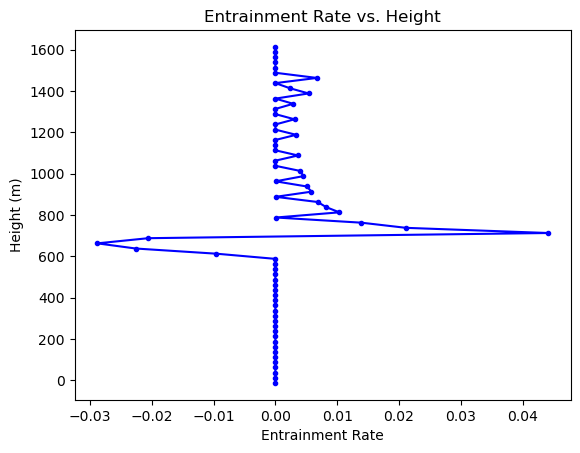

In [16]:
dataset = nc.Dataset('single_3d_cloud_0.nc')
z = dataset.variables['z'][:]

cumulative_avg_mse_cloud = np.zeros(len(z))  # Assuming 67 height levels based on your previous information
cumulative_avg_mse_env = np.zeros(len(z))

for file_num in range(21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    
    for i in range(l.shape[0]):  # Loop through the vertical dimension
        cloud_mask = l[i, :, :] > 0.0
        env_mask = l[i, :, :] <= 0.0
        
        # For cloud
        cloud_points_count = np.sum(cloud_mask)
        if cloud_points_count > 0:  # To avoid division by zero
            avg_mse_this_cloud_level = np.nansum(s[i, cloud_mask]) / cloud_points_count
            cumulative_avg_mse_cloud[i] += avg_mse_this_cloud_level
        
        # For environment
        env_points_count = np.sum(env_mask)
        if env_points_count > 0:  # To avoid division by zero
            avg_mse_this_env_level = np.nansum(s[i, env_mask]) / env_points_count
            cumulative_avg_mse_env[i] += avg_mse_this_env_level

            
entrainment_rates = []
for i in range(len(z)-1):
    delta_s = cumulative_avg_mse_cloud[i+1] - cumulative_avg_mse_cloud[i]
    delta_z = z[i+1] - z[i]
    
    s_c = cumulative_avg_mse_cloud[i]
    s_e = cumulative_avg_mse_env[i]
    entrainment = (delta_s / delta_z) * (1 / (s_c - s_e))
    entrainment_rates.append(entrainment)
        
# Plotting
plt.plot(entrainment_rates, z[:-1], marker = '.', color='blue')
plt.xlabel("Entrainment Rate")
plt.ylabel("Height (m)")
plt.title("Entrainment Rate vs. Height")
plt.show()
hide_toggle()



## Different approach 

Taking every time step as a different (independent) dataset. For every file calculate the entrainment rate (with height). Similar process: take the average mse for ever level of inside the cloud and same for the outside of the cloud. Then apply the entrainment equation from above and plot entrainment value with height. 

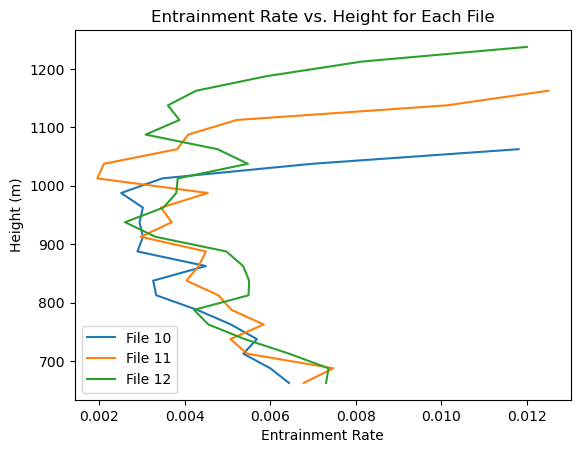

In [17]:
# Define function to calculate entrainment rate
def calculate_entrainment(mse_cloud, mse_env, z):
    entrainment_rates = []
    for i in range(len(mse_cloud) - 1):  # We omit the last height level
        delta_s = mse_cloud[i+1] - mse_cloud[i]
        delta_z = z[i+1] - z[i]
        denominator = mse_cloud[i] - mse_env[i]
        
        if denominator != 0:
            entrainment = - (delta_s / delta_z) / denominator
            entrainment_rates.append(entrainment)
        else:
            entrainment_rates.append(np.nan)  # Handling potential division by zero
    
    return entrainment_rates

# For each file, calculate the average MSE inside and outside the cloud and then compute entrainment
for file_num in range(10,13):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    
    mse_cloud = []
    mse_env = []
    
    for i in range(l.shape[0]):
        mask_cloud = l[i, :, :] > 0.0
        mask_env = ~mask_cloud
        
        if np.any(mask_cloud):
            mse_cloud.append(np.nanmean(s[i, mask_cloud]))
        else:
            mse_cloud.append(np.nan)  # If no cloud points
        
        if np.any(mask_env):
            mse_env.append(np.nanmean(s[i, mask_env]))
        else:
            mse_env.append(np.nan)  # If no environment points

    # Calculate the entrainment rates
    entrainment_rates = calculate_entrainment(mse_cloud, mse_env, z)

    # Plot
    plt.plot(entrainment_rates, z[:-1], label=f'File {file_num}')

# Add legend, labels, and title
plt.legend(loc='best')
plt.xlabel("Entrainment Rate")
plt.ylabel("Height (m)")
plt.title("Entrainment Rate vs. Height for Each File")
plt.show()
hide_toggle()



## Variability of entrainment rates. 

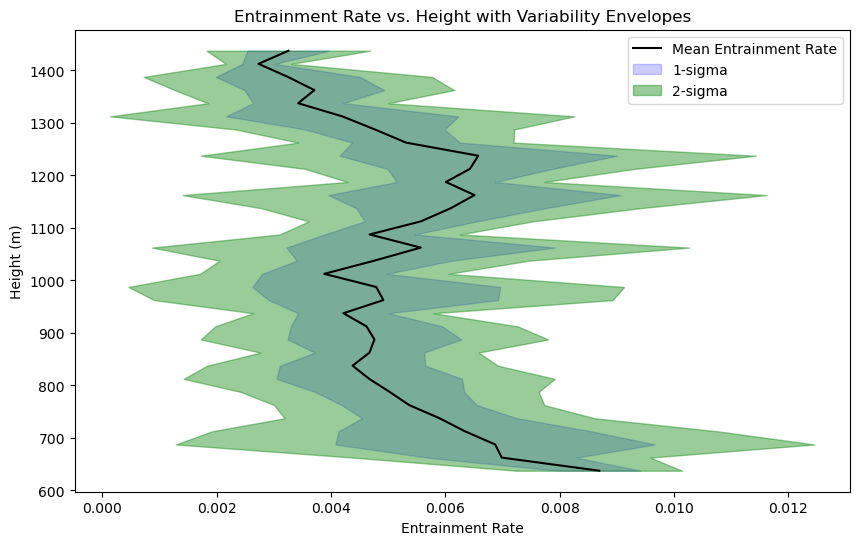

In [18]:
all_entrainment_rates = []

# For each file, calculate the average MSE inside and outside the cloud and then compute entrainment
for file_num in range(0,21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    
    mse_cloud = []
    mse_env = []
    
    for i in range(l.shape[0]):
        mask_cloud = l[i, :, :] > 0.0
        mask_env = ~mask_cloud
        
        if np.any(mask_cloud):
            mse_cloud.append(np.nanmean(s[i, mask_cloud]))
        else:
            mse_cloud.append(np.nan)  # If no cloud points
        
        if np.any(mask_env):
            mse_env.append(np.nanmean(s[i, mask_env]))
        else:
            mse_env.append(np.nan)  # If no environment points

    # Calculate the entrainment rates and store them in the 2D list
    entrainment_rates = calculate_entrainment(mse_cloud, mse_env, z)
    all_entrainment_rates.append(entrainment_rates)

# Convert the list to a numpy array for easier calculations
all_entrainment_rates = np.array(all_entrainment_rates)

# Calculate the mean and standard deviation for each height level
mean_entrainment = np.nanmean(all_entrainment_rates, axis=0)
std_entrainment = np.nanstd(all_entrainment_rates, axis=0)

# Plot
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(mean_entrainment, z[:-1], label='Mean Entrainment Rate', color='black')
ax.fill_betweenx(z[:-1], mean_entrainment - std_entrainment, mean_entrainment + std_entrainment, color='blue', alpha=0.2, label='1-sigma')
ax.fill_betweenx(z[:-1], mean_entrainment - 2*std_entrainment, mean_entrainment + 2*std_entrainment, color='green', alpha=0.4, label='2-sigma')

# Add legend, labels, and title
ax.legend(loc='best')
ax.set_xlabel("Entrainment Rate")
ax.set_ylabel("Height (m)")
ax.set_title("Entrainment Rate vs. Height with Variability Envelopes")
plt.show()

hide_toggle()


### Steps of the code below: 
1. Function for Area, Circumference, and Effective Radius:
    - Loop through data points.
    - Identify cloud points to compute the cloud's area and circumference.
    - Calculate the effective radius using the area.
2. Function to Calculate Entrainment Rate:
    - Iterate over cloud levels.
    - Compute change in MSE and vertical distance.
    - Calculate entrainment rate, ensuring no division by zero.
3. Load Dataset:
    - Load variables: cloud mask (l), moist static energy (s), and height (z).
4. Compute MSE Averages:
    - Separate cloud and environment points at each level.
    - Calculate average MSE for both.
5. Determine Effective Radii:
    - For each level, get the effective radius.
6. Compute Entrainment Rates:
    - Use MSE values to determine entrainment rates.
7. Calculate 0.2/R and 0.3/R relationships

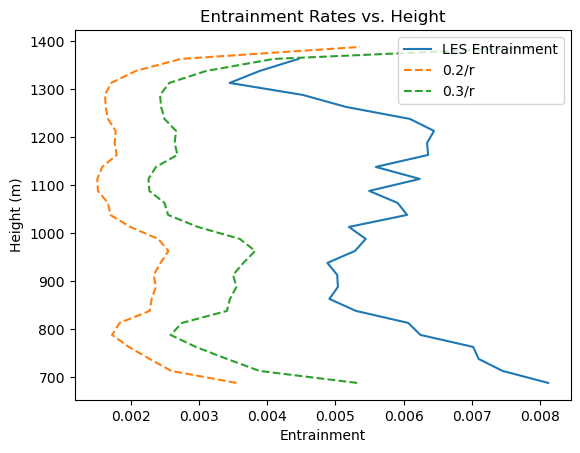

In [19]:
def compute_area_circumference_2d(data, dx, dy):
    # Calculate area and circumference
    area = 0
    circumference = 0
    
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            if data[i, j] > 0:
                area += dx * dy
                
                # Check for exposed edges (forming the circumference)
                if i == 0 or data[i-1, j] <= 0: 
                    circumference += dy
                if i == data.shape[0]-1 or data[i+1, j] <= 0: 
                    circumference += dy
                if j == 0 or data[i, j-1] <= 0:
                    circumference += dx
                if j == data.shape[1]-1 or data[i, j+1] <= 0:
                    circumference += dx
                    
    # Calculate effective radius (assuming the area is pi*r^2 for a circle)
    effective_radius = np.sqrt(area / np.pi)
    return area, circumference, effective_radius

def calculate_entrainment(mse_cloud, mse_env, z):
    entrainment_rates = []
    for i in range(len(mse_cloud) - 1):  # We omit the last height level
        delta_s = mse_cloud[i+1] - mse_cloud[i]
        delta_z = z[i+1] - z[i]
        denominator = mse_cloud[i] - mse_env[i]
        
        if denominator != 0:
            entrainment = - (delta_s / delta_z) / denominator
            entrainment_rates.append(entrainment)
        else:
            entrainment_rates.append(np.nan)  # Handling potential division by zero
    
    return entrainment_rates

# Load the dataset
dataset = nc.Dataset('single_3d_cloud_18.nc')
l = dataset.variables['l'][:]
s = dataset.variables['s'][:]
z = dataset.variables['z'][:]

mse_cloud = []
mse_env = []
effective_radii = []

for i in range(l.shape[0]):
    mask_cloud = l[i, :, :] > 0.0
    mask_env = ~mask_cloud
    
    if np.any(mask_cloud):
        mse_cloud.append(np.nanmean(s[i, mask_cloud]))
    else:
        mse_cloud.append(np.nan)
    
    if np.any(mask_env):
        mse_env.append(np.nanmean(s[i, mask_env]))
    else:
        mse_env.append(np.nan)
    
    area, circumference, eff_rad = compute_area_circumference_2d(l[i, :, :], dx, dy)
    effective_radii.append(eff_rad)

entrainment_rates = calculate_entrainment(mse_cloud, mse_env, z)

# Calculate the relationship (0.2/effective radius) and filter out zeros
relationship_02 = [0.2/r if r!=0 else np.nan for r in effective_radii]
relationship_03 = [0.3/r if r!=0 else np.nan for r in effective_radii]

# Plot
plt.plot(entrainment_rates, z[:-1], label='LES Entrainment')
plt.plot(relationship_02, z, label='0.2/r', linestyle='--')
plt.plot(relationship_03, z, label='0.3/r', linestyle='--')
plt.legend(loc='best')
plt.xlabel("Entrainment")
plt.ylabel("Height (m)")
plt.title("Entrainment Rates vs. Height")
plt.show()

hide_toggle()


## Filtering out wet downdraft areas
Upon Adrian's suggestion I added a more selective mask with the additional condition that vertical velocity needs to be positive and greater than 1.0. Warning: might not be done correctly? 

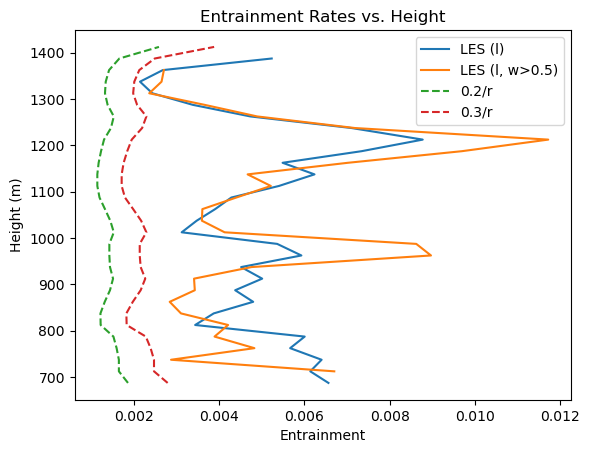

In [20]:
dataset = nc.Dataset('single_3d_cloud_15.nc')
l = dataset.variables['l'][:]
s = dataset.variables['s'][:]
z = dataset.variables['z'][:]
w = dataset.variables['w'][:]

mse_cloud_l = []
mse_cloud_l_w = []
mse_env_l = []
mse_env_l_w = []
effective_radii_l = []
effective_radii_l_w = []

for i in range(l.shape[0]):
    mask_cloud_l = l[i, :, :] > 0.0
    mask_cloud_l_w = np.logical_and(mask_cloud_l, w[i, :, :] > 1.0)
    
    mask_env_l = ~mask_cloud_l
    mask_env_l_w = ~mask_cloud_l_w
    
    mse_cloud_l.append(np.nanmean(s[i, mask_cloud_l]) if np.any(mask_cloud_l) else np.nan)
    mse_cloud_l_w.append(np.nanmean(s[i, mask_cloud_l_w]) if np.any(mask_cloud_l_w) else np.nan)
    
    mse_env_l.append(np.nanmean(s[i, mask_env_l]) if np.any(mask_env_l) else np.nan)
    mse_env_l_w.append(np.nanmean(s[i, mask_env_l_w]) if np.any(mask_env_l_w) else np.nan)
    
    area_l, _, eff_rad_l = compute_area_circumference_2d(l[i, :, :], dx, dy)
    effective_radii_l.append(eff_rad_l)
    area_l_w, _, eff_rad_l_w = compute_area_circumference_2d(l[i, :, :] * mask_cloud_l_w, dx, dy)
    effective_radii_l_w.append(eff_rad_l_w)

entrainment_rates_l = calculate_entrainment(mse_cloud_l, mse_env_l, z)
entrainment_rates_l_w = calculate_entrainment(mse_cloud_l_w, mse_env_l_w, z)

# Calculate the relationship (0.2/effective radius) and filter out zeros
relationship_02 = [0.2/r if r!=0 else np.nan for r in effective_radii_l]
relationship_03 = [0.3/r if r!=0 else np.nan for r in effective_radii_l]

# Plot
plt.plot(entrainment_rates_l, z[:-1], label='LES (l)')
plt.plot(entrainment_rates_l_w, z[:-1], label='LES (l, w>0.5)', linestyle='-')
plt.plot(relationship_02, z, label='0.2/r', linestyle='--')
plt.plot(relationship_03, z, label='0.3/r', linestyle='--')
plt.legend(loc='best')
plt.xlabel("Entrainment")
plt.ylabel("Height (m)")
plt.title("Entrainment Rates vs. Height")
plt.show()


hide_toggle()

### time-series
Difference between les entrainment and 0.2/r entrainment at every height. Calculated for every file and every height. 

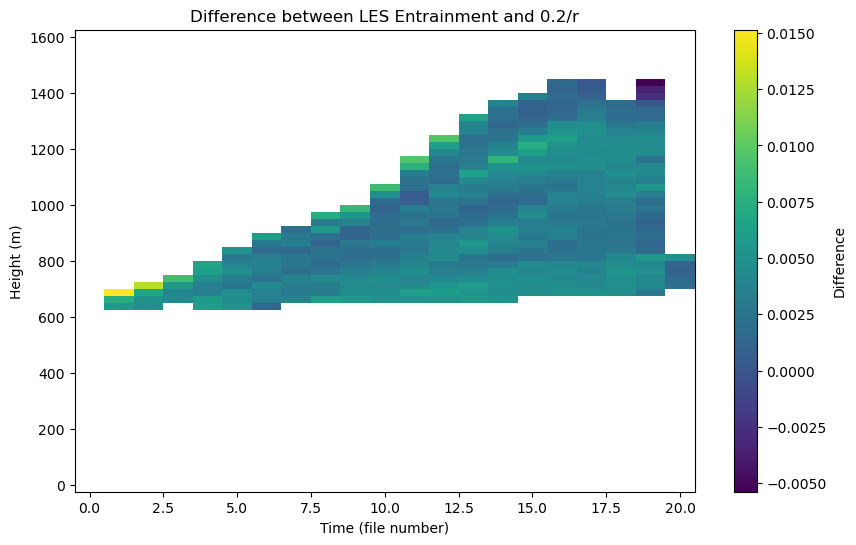

In [21]:

all_differences = []

# Loop through all files
for file_num in range(21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    dx = dataset.variables['x'][1] - dataset.variables['x'][0]
    dy = dataset.variables['y'][1] - dataset.variables['y'][0]
    
    mse_cloud = [np.nanmean(s[i, l[i, :, :] > 0.0]) if np.any(l[i, :, :] > 0.0) else np.nan for i in range(l.shape[0])]
    mse_env = [np.nanmean(s[i, l[i, :, :] <= 0.0]) if np.any(l[i, :, :] <= 0.0) else np.nan for i in range(l.shape[0])]
    
    les_entrainment = calculate_entrainment(mse_cloud, mse_env, z)
    _, _, eff_rad = zip(*[compute_area_circumference_2d(l[i, :, :], dx, dy) for i in range(l.shape[0])])
    
    relationship_02 = [0.2/r if r!=0 else np.nan for r in eff_rad]
    
    # Calculate the differences between LES entrainment and 0.2/r at every height
    differences = [les - rel for les, rel in zip(les_entrainment, relationship_02[:-1])] # [:-1] because les_entrainment is shorter by one
    all_differences.append(differences)

# Now, let's plot it
fig, ax = plt.subplots(figsize=(10, 6))
c = ax.pcolormesh(np.arange(21), z[:-1], np.transpose(all_differences), shading='auto', cmap='viridis') 
# Transpose because pcolormesh needs time on x and height on y
ax.set_xlabel('Time (file number)')
ax.set_ylabel('Height (m)')
ax.set_title('Difference between LES Entrainment and 0.2/r')
fig.colorbar(c, ax=ax, label='Difference')
plt.show()

hide_toggle()


### semi-normalised
To get a view of how much the LES entrainment is overestimating, the difference is divided by the average 0.2/r value. 

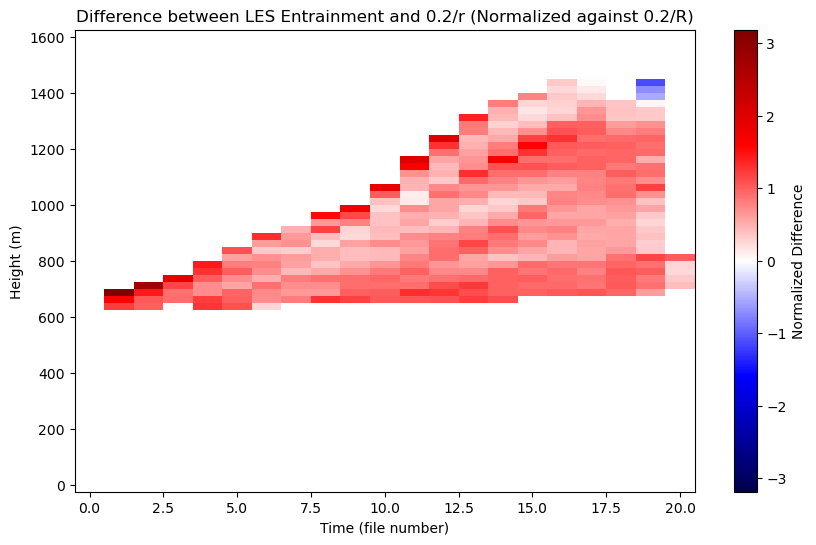

In [22]:
all_differences = []

for file_num in range(21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    dx = dataset.variables['x'][1] - dataset.variables['x'][0]
    dy = dataset.variables['y'][1] - dataset.variables['y'][0]
    
    mse_cloud = [np.nanmean(s[i, l[i, :, :] > 0.0]) if np.any(l[i, :, :] > 0.0) else np.nan for i in range(l.shape[0])]
    mse_env = [np.nanmean(s[i, l[i, :, :] <= 0.0]) if np.any(l[i, :, :] <= 0.0) else np.nan for i in range(l.shape[0])]
    
    les_entrainment = calculate_entrainment(mse_cloud, mse_env, z)
    _, _, eff_rad = zip(*[compute_area_circumference_2d(l[i, :, :], dx, dy) for i in range(l.shape[0])])
    
    relationship_02 = [0.2/r if r!=0 else np.nan for r in eff_rad]
    
    # Calculate the differences between LES entrainment and 0.2/r at every height
    differences = [les - rel for les, rel in zip(les_entrainment, relationship_02[:-1])] # [:-1] because les_entrainment is shorter by one
    all_differences.append(differences)

# Normalize all differences against the total average 0.2/r entrainment rate
total_avg_entrainment = np.nanmean(relationship_02)
all_differences = [[diff/total_avg_entrainment for diff in differences] for differences in all_differences]

# Now, let's plot it
fig, ax = plt.subplots(figsize=(10, 6))
max_abs_difference = np.nanmax(np.abs(all_differences))
c = ax.pcolormesh(np.arange(21), z[:-1], np.transpose(all_differences), shading='auto', cmap='seismic', vmin=-max_abs_difference, vmax=max_abs_difference) 
# Transpose because pcolormesh needs time on x and height on y
ax.set_xlabel('Time (file number)')
ax.set_ylabel('Height (m)')
ax.set_title('Difference between LES Entrainment and 0.2/r (Normalized against 0.2/R)')
fig.colorbar(c, ax=ax, label='Normalized Difference')
plt.show()

hide_toggle()


## Does branchiness (fractality) matter? 

Average 2d fractality with time.


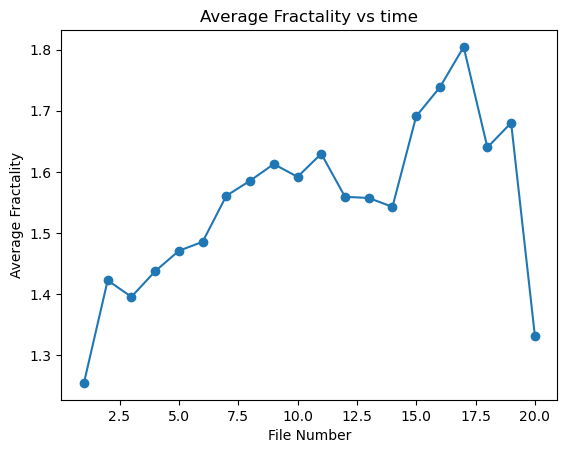

In [23]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt

# Compute area, circumference, and effective radius
def compute_area_circumference_2d(mask, dx, dy):
    A_total = 0
    C_total = 0
    
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if mask[i, j] > 0:
                # Compute area contribution
                A_total += dx * dy
                
                # Check for cloud boundary for circumference
                if i == 0 or mask[i-1, j] == 0: C_total += dy
                if i == mask.shape[0]-1 or mask[i+1, j] == 0: C_total += dy
                if j == 0 or mask[i, j-1] == 0: C_total += dx
                if j == mask.shape[1]-1 or mask[i, j+1] == 0: C_total += dx

    eff_rad = np.sqrt(A_total/np.pi)
    return A_total, C_total, eff_rad

# Initialize lists to store results
file_nums = []
avg_fractalities = []

# Process each file
for file_num in range(0, 21):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    dx = dataset.variables['x'][1] - dataset.variables['x'][0]
    dy = dataset.variables['y'][1] - dataset.variables['y'][0]
    
    # Calculate cloud characteristics
    _, circumferences, eff_rads = zip(*[compute_area_circumference_2d(l[i, :, :], dx, dy) for i in range(l.shape[0])])
    
    # Calculate fractality for each level and then average over all levels
    fractalities = [circumference / (2 * np.pi * r) if r != 0 else np.nan for circumference, r in zip(circumferences, eff_rads)]
    avg_fractality = np.nanmean(fractalities)  # Averages, ignoring NaN values
    
    # Append to the lists
    file_nums.append(file_num)
    avg_fractalities.append(avg_fractality)

# Plot
plt.plot(file_nums, avg_fractalities, '-o')
plt.xlabel('File Number')
plt.ylabel('Average Fractality')
plt.title('Average Fractality vs time')
plt.show()

hide_toggle()

### Entrainment prediction difference against fractality.
Cyril gave the idea of nondimensionlising time. I guess this is kind of done with the relatioonship against fractality. 

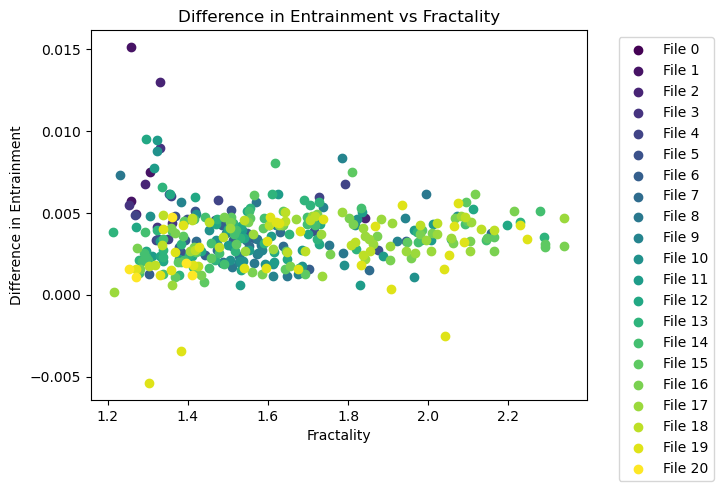

In [24]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Compute area, circumference, and effective radius
def compute_area_circumference_2d(mask, dx, dy):
    A_total = 0
    C_total = 0
    
    for i in range(mask.shape[0]):
        for j in range(mask.shape[1]):
            if mask[i, j] > 0:
                # Compute area contribution
                A_total += dx * dy
                
                # Check for cloud boundary for circumference
                if i == 0 or mask[i-1, j] == 0: C_total += dy
                if i == mask.shape[0]-1 or mask[i+1, j] == 0: C_total += dy
                if j == 0 or mask[i, j-1] == 0: C_total += dx
                if j == mask.shape[1]-1 or mask[i, j+1] == 0: C_total += dx

    eff_rad = np.sqrt(A_total/np.pi)
    return A_total, C_total, eff_rad

# Calculate entrainment rate
def calculate_entrainment(mse_cloud, mse_env, z):
    entrainment_rates = []
    for i in range(len(mse_cloud) - 1):  
        delta_s = mse_cloud[i+1] - mse_cloud[i]
        delta_z = z[i+1] - z[i]
        denominator = mse_cloud[i] - mse_env[i]
        
        if denominator != 0:
            entrainment = - (delta_s / delta_z) / denominator
            entrainment_rates.append(entrainment)
        else:
            entrainment_rates.append(np.nan)
    
    return entrainment_rates

# Set the colormap
colors = cm.viridis(np.linspace(0, 1, 21))

for file_num, color in zip(range(0, 21), colors):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    dx = dataset.variables['x'][1] - dataset.variables['x'][0]
    dy = dataset.variables['y'][1] - dataset.variables['y'][0]

    # Calculate average MSE
    mse_cloud = [np.nanmean(s[i, l[i, :, :] > 0.0]) if np.any(l[i, :, :] > 0.0) else np.nan for i in range(l.shape[0])]
    mse_env = [np.nanmean(s[i, l[i, :, :] <= 0.0]) if np.any(l[i, :, :] <= 0.0) else np.nan for i in range(l.shape[0])]

    # Calculate entrainment rates
    les_entrainment = calculate_entrainment(mse_cloud, mse_env, z)

    # Calculate 0.2/r entrainment
    _, _, eff_rad = zip(*[compute_area_circumference_2d(l[i, :, :], dx, dy) for i in range(l.shape[0])])
    entrainment_02 = [0.2 / r if r != 0 else np.nan for r in eff_rad]

    # Calculate differences
    difference = [les - e_02 for les, e_02 in zip(les_entrainment, entrainment_02)]

    # Calculate fractality
    fractality = [circumference / (2 * np.pi * r) if r != 0 else np.nan for circumference, r in zip(_, eff_rad)]

    # Plotting
    plt.scatter(fractality[:-1], difference, marker='o', color=color, label=f'File {file_num}')

plt.xlabel('Fractality')
plt.ylabel('Difference in Entrainment')
plt.title('Difference in Entrainment vs Fractality')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

hide_toggle()


### LES entrainmne against fractality

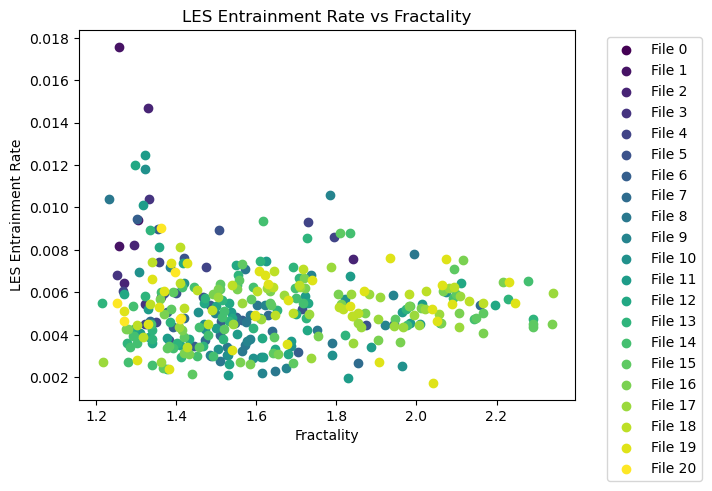

In [25]:
colors = cm.viridis(np.linspace(0, 1, 21))

for file_num, color in zip(range(0, 21), colors):
    dataset = nc.Dataset(f'single_3d_cloud_{file_num}.nc')
    l = dataset.variables['l'][:]
    s = dataset.variables['s'][:]
    z = dataset.variables['z'][:]
    dx = dataset.variables['x'][1] - dataset.variables['x'][0]
    dy = dataset.variables['y'][1] - dataset.variables['y'][0]

    # Calculate average MSE
    mse_cloud = [np.nanmean(s[i, l[i, :, :] > 0.0]) if np.any(l[i, :, :] > 0.0) else np.nan for i in range(l.shape[0])]
    mse_env = [np.nanmean(s[i, l[i, :, :] <= 0.0]) if np.any(l[i, :, :] <= 0.0) else np.nan for i in range(l.shape[0])]

    # Calculate entrainment rates
    les_entrainment = calculate_entrainment(mse_cloud, mse_env, z)

    # Calculate fractality
    _, _, eff_rad = zip(*[compute_area_circumference_2d(l[i, :, :], dx, dy) for i in range(l.shape[0])])
    fractality = [circumference / (2 * np.pi * r) if r != 0 else np.nan for circumference, r in zip(_, eff_rad)]

    # Plotting fractality against LES entrainment rate
    plt.scatter(fractality[:-1], les_entrainment, marker='o', color=color, label=f'File {file_num}')

plt.xlabel('Fractality')
plt.ylabel('LES Entrainment Rate')
plt.title('LES Entrainment Rate vs Fractality')
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

hide_toggle()


Possible issues: 
- entrainment calculation averaging (horizontal first?)
- which height level to take when $\frac{\delta s}{\delta z}$. change and see if there is any difference. 

Next steps: 
1. object detecting algorithm to index all objects in the field (in a single time frame)
2. calculate the entrainment rate as performed above 
    - using effective radius
    - using variability statistics
3. do this for all time steps. 

Side-step: 
1. make trajectory code work
2. replace the above calculation of entrainment rate with 